<a href="https://colab.research.google.com/github/srinijalanda93/Predictive_Analystics/blob/main/PA_LAb8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import seaborn as sns
from geopy.geocoders import Nominatim
from geopy.distance import geodesic
import time
import warnings
warnings.filterwarnings('ignore')

# Set style for better visualizations
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

### **DATA LOADING & PREPROCESSING**

In [2]:
def load_and_prepare_data(file_path):
    """Load dataset and extract coordinates"""
    print(" Loading dataset...")
    df = pd.read_excel(file_path)
    print(f" Loaded {len(df)} cities")
    print(df.head())

    # Initialize geocoder
    geolocator = Nominatim(user_agent="tsp_solver")

    # Extract coordinates
    coords = []
    cities_info = []

    print("\n Extracting coordinates...")
    for idx, row in df.iterrows():
        try:
            location_query = f"{row['City']}, {row['State']}, India"
            location = geolocator.geocode(location_query, timeout=10)

            if location:
                coords.append((location.latitude, location.longitude))
                cities_info.append({
                    'SNo': row['SNo'],
                    'City': row['City'],
                    'State': row['State'],
                    'Lat': location.latitude,
                    'Lon': location.longitude
                })
                print(f"   {row['City']}: ({location.latitude:.4f}, {location.longitude:.4f})")
            time.sleep(1)  # Respect rate limits

        except Exception as e:
            print(f"   Error for {row['City']}: {e}")

    cities_df = pd.DataFrame(cities_info)
    return cities_df, np.array(coords)

### **DISTANCE CALCULATION**

In [3]:
def calculate_distance_matrix(coords):
    """Calculate distance matrix using geodesic distance"""
    n = len(coords)
    dist_matrix = np.zeros((n, n))

    for i in range(n):
        for j in range(i+1, n):
            dist = geodesic(coords[i], coords[j]).kilometers
            dist_matrix[i][j] = dist
            dist_matrix[j][i] = dist

    return dist_matrix

### **GENETIC ALGORITHM IMPLEMENTATION**

In [4]:
class GeneticAlgorithmTSP:
    def __init__(self, distance_matrix, pop_size=100, elite_size=20,
                 mutation_rate=0.01, generations=500):
        self.distance_matrix = distance_matrix
        self.n_cities = len(distance_matrix)
        self.pop_size = pop_size
        self.elite_size = elite_size
        self.mutation_rate = mutation_rate
        self.generations = generations
        self.best_routes_history = []
        self.best_distances_history = []

    def create_route(self):
        """Create a random route (chromosome)"""
        return list(np.random.permutation(self.n_cities))

    def initial_population(self):
        """Generate initial population"""
        return [self.create_route() for _ in range(self.pop_size)]

    def route_distance(self, route):
        """Calculate total distance of a route"""
        distance = 0
        for i in range(len(route)):
            from_city = route[i]
            to_city = route[(i + 1) % len(route)]
            distance += self.distance_matrix[from_city][to_city]
        return distance

    def fitness(self, route):
        """Calculate fitness (inverse of distance)"""
        return 1 / self.route_distance(route)

    def rank_routes(self, population):
        """Rank routes by fitness"""
        fitness_results = {}
        for i, route in enumerate(population):
            fitness_results[i] = self.fitness(route)
        return sorted(fitness_results.items(), key=lambda x: x[1], reverse=True)

    def selection(self, pop_ranked):
        """Select parents using fitness proportionate selection"""
        selection_results = []

        # Elitism - keep best routes
        for i in range(self.elite_size):
            selection_results.append(pop_ranked[i][0])

        # Roulette wheel selection for rest
        df = pd.DataFrame(np.array(pop_ranked), columns=["Index", "Fitness"])
        df['cum_sum'] = df.Fitness.cumsum()
        df['cum_perc'] = 100 * df.cum_sum / df.Fitness.sum()

        for i in range(len(pop_ranked) - self.elite_size):
            pick = 100 * np.random.random()
            for j in range(len(pop_ranked)):
                if pick <= df.iat[j, 3]:
                    selection_results.append(pop_ranked[j][0])
                    break

        return selection_results

    def mating_pool(self, population, selection_results):
        """Create mating pool from selection"""
        return [population[i] for i in selection_results]

    def breed(self, parent1, parent2):
        """Crossover - Ordered Crossover (OX)"""
        child = []
        child_p1 = []
        child_p2 = []

        gene_a = int(np.random.random() * len(parent1))
        gene_b = int(np.random.random() * len(parent1))

        start_gene = min(gene_a, gene_b)
        end_gene = max(gene_a, gene_b)

        # Get segment from parent1
        for i in range(start_gene, end_gene):
            child_p1.append(parent1[i])

        # Fill remaining from parent2
        child_p2 = [item for item in parent2 if item not in child_p1]

        child = child_p1 + child_p2
        return child

    def breed_population(self, matingpool):
        """Breed entire population"""
        children = []
        length = len(matingpool) - self.elite_size
        pool = np.random.permutation(len(matingpool))

        # Keep elite
        for i in range(self.elite_size):
            children.append(matingpool[i])

        # Breed rest
        for i in range(length):
            child = self.breed(matingpool[pool[i]], matingpool[pool[len(matingpool)-i-1]])
            children.append(child)

        return children

    def mutate(self, individual):
        """Mutation - Swap Mutation"""
        for swapped in range(len(individual)):
            if np.random.random() < self.mutation_rate:
                swap_with = int(np.random.random() * len(individual))

                city1 = individual[swapped]
                city2 = individual[swap_with]

                individual[swapped] = city2
                individual[swap_with] = city1
        return individual

    def mutate_population(self, population):
        """Mutate entire population"""
        mutated_pop = []

        for ind in range(len(population)):
            mutated_ind = self.mutate(population[ind])
            mutated_pop.append(mutated_ind)

        return mutated_pop

    def next_generation(self, current_gen):
        """Create next generation"""
        pop_ranked = self.rank_routes(current_gen)
        selection_results = self.selection(pop_ranked)
        matingpool = self.mating_pool(current_gen, selection_results)
        children = self.breed_population(matingpool)
        next_gen = self.mutate_population(children)
        return next_gen

    def solve(self):
        """Solve TSP using GA"""
        print("\n🧬 Starting Genetic Algorithm...")
        print(f"Population Size: {self.pop_size}")
        print(f"Elite Size: {self.elite_size}")
        print(f"Mutation Rate: {self.mutation_rate}")
        print(f"Generations: {self.generations}\n")

        # Initial population
        pop = self.initial_population()

        # Evolution
        for i in range(self.generations):
            pop = self.next_generation(pop)

            # Track best route
            pop_ranked = self.rank_routes(pop)
            best_route_idx = pop_ranked[0][0]
            best_route = pop[best_route_idx]
            best_distance = self.route_distance(best_route)

            self.best_routes_history.append(best_route.copy())
            self.best_distances_history.append(best_distance)

            if i % 50 == 0:
                print(f"Generation {i:3d}: Best Distance = {best_distance:.2f} km")

        # Final best route
        pop_ranked = self.rank_routes(pop)
        best_route_idx = pop_ranked[0][0]
        best_route = pop[best_route_idx]

        print(f"\n✓ Final Best Distance: {self.route_distance(best_route):.2f} km")

        return best_route, self.route_distance(best_route)

### **VISUALIZATION**

In [5]:
def plot_convergence(distances_history):
    """Plot convergence curve"""
    fig, ax = plt.subplots(figsize=(12, 6))

    ax.plot(distances_history, linewidth=2, color='#2E86AB')
    ax.set_xlabel('Generation', fontsize=12, fontweight='bold')
    ax.set_ylabel('Best Distance (km)', fontsize=12, fontweight='bold')
    ax.set_title('Genetic Algorithm Convergence', fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)

    # Add improvement percentage
    initial = distances_history[0]
    final = distances_history[-1]
    improvement = ((initial - final) / initial) * 100
    ax.text(0.7, 0.95, f'Improvement: {improvement:.1f}%',
            transform=ax.transAxes, fontsize=11,
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

    plt.tight_layout()
    plt.show()

def plot_route_on_map(cities_df, route, distance, title="Best Route Found"):
    """Plot route on map"""
    fig, ax = plt.subplots(figsize=(14, 10))

    # Plot route
    route_coords = cities_df.iloc[route]

    # Draw lines
    for i in range(len(route)):
        start = route_coords.iloc[i]
        end = route_coords.iloc[(i + 1) % len(route)]
        ax.plot([start['Lon'], end['Lon']],
                [start['Lat'], end['Lat']],
                'b-', linewidth=2, alpha=0.6)

    # Plot cities
    ax.scatter(cities_df['Lon'], cities_df['Lat'],
               c='red', s=200, zorder=5, edgecolors='black', linewidth=2)

    # Label cities
    for idx, row in cities_df.iterrows():
        ax.annotate(row['City'],
                   (row['Lon'], row['Lat']),
                   xytext=(5, 5),
                   textcoords='offset points',
                   fontsize=9,
                   fontweight='bold',
                   bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.7))

    # Highlight start city
    start_city = cities_df.iloc[route[0]]
    ax.scatter(start_city['Lon'], start_city['Lat'],
               c='green', s=400, marker='*', zorder=6,
               edgecolors='black', linewidth=2, label='Start/End')

    ax.set_xlabel('Longitude', fontsize=12, fontweight='bold')
    ax.set_ylabel('Latitude', fontsize=12, fontweight='bold')
    ax.set_title(f'{title}\nTotal Distance: {distance:.2f} km',
                 fontsize=14, fontweight='bold')
    ax.legend(fontsize=10)
    ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

def plot_distance_matrix_heatmap(distance_matrix, cities_df):
    """Plot distance matrix as heatmap"""
    fig, ax = plt.subplots(figsize=(12, 10))

    sns.heatmap(distance_matrix,
                annot=True,
                fmt='.0f',
                cmap='YlOrRd',
                xticklabels=cities_df['City'],
                yticklabels=cities_df['City'],
                cbar_kws={'label': 'Distance (km)'},
                ax=ax)

    ax.set_title('Distance Matrix Between Cities', fontsize=14, fontweight='bold')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

def plot_route_comparison(cities_df, initial_route, initial_dist,
                         final_route, final_dist):
    """Compare initial random route vs optimized route"""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))

    # Initial route
    route_coords = cities_df.iloc[initial_route]
    for i in range(len(initial_route)):
        start = route_coords.iloc[i]
        end = route_coords.iloc[(i + 1) % len(initial_route)]
        ax1.plot([start['Lon'], end['Lon']],
                [start['Lat'], end['Lat']],
                'r-', linewidth=2, alpha=0.6)

    ax1.scatter(cities_df['Lon'], cities_df['Lat'],
               c='red', s=200, zorder=5, edgecolors='black', linewidth=2)
    ax1.set_title(f'Initial Random Route\nDistance: {initial_dist:.2f} km',
                  fontsize=12, fontweight='bold')
    ax1.grid(True, alpha=0.3)

    # Final route
    route_coords = cities_df.iloc[final_route]
    for i in range(len(final_route)):
        start = route_coords.iloc[i]
        end = route_coords.iloc[(i + 1) % len(final_route)]
        ax2.plot([start['Lon'], end['Lon']],
                [start['Lat'], end['Lat']],
                'g-', linewidth=2, alpha=0.6)

    ax2.scatter(cities_df['Lon'], cities_df['Lat'],
               c='green', s=200, zorder=5, edgecolors='black', linewidth=2)
    ax2.set_title(f'Optimized GA Route\nDistance: {final_dist:.2f} km',
                  fontsize=12, fontweight='bold')
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

def animate_evolution(cities_df, routes_history, distances_history, interval=100):
    """Animate the evolution of routes over generations"""
    print("\n Creating evolution animation...")

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

    def update(frame):
        ax1.clear()
        ax2.clear()

        # Plot route
        route = routes_history[frame]
        route_coords = cities_df.iloc[route]

        for i in range(len(route)):
            start = route_coords.iloc[i]
            end = route_coords.iloc[(i + 1) % len(route)]
            ax1.plot([start['Lon'], end['Lon']],
                    [start['Lat'], end['Lat']],
                    'b-', linewidth=2, alpha=0.6)

        ax1.scatter(cities_df['Lon'], cities_df['Lat'],
                   c='red', s=150, zorder=5, edgecolors='black', linewidth=2)
        ax1.set_title(f'Generation {frame}\nDistance: {distances_history[frame]:.2f} km',
                     fontsize=12, fontweight='bold')
        ax1.grid(True, alpha=0.3)

        # Plot convergence
        ax2.plot(distances_history[:frame+1], 'g-', linewidth=2)
        ax2.set_xlim(0, len(distances_history))
        ax2.set_ylim(min(distances_history)*0.95, max(distances_history)*1.05)
        ax2.set_xlabel('Generation')
        ax2.set_ylabel('Distance (km)')
        ax2.set_title('Convergence Progress')
        ax2.grid(True, alpha=0.3)

    # Sample frames for animation
    frames = list(range(0, len(routes_history), max(1, len(routes_history)//50)))
    anim = FuncAnimation(fig, update, frames=frames, interval=interval, repeat=True)
    plt.close()

    return HTML(anim.to_jshtml())

def compare_multiple_algorithms(distance_matrix, cities_df):
    """Compare GA with other heuristics"""
    print("\n Comparing with other algorithms...")

    # Nearest Neighbor Heuristic
    def nearest_neighbor(dist_matrix):
        n = len(dist_matrix)
        unvisited = set(range(1, n))
        route = [0]
        current = 0

        while unvisited:
            nearest = min(unvisited, key=lambda x: dist_matrix[current][x])
            route.append(nearest)
            unvisited.remove(nearest)
            current = nearest

        distance = sum(dist_matrix[route[i]][route[(i+1)%n]] for i in range(n))
        return route, distance

    # Random sampling
    def random_search(dist_matrix, iterations=1000):
        n = len(dist_matrix)
        best_route = list(range(n))
        best_dist = sum(dist_matrix[best_route[i]][best_route[(i+1)%n]] for i in range(n))

        for _ in range(iterations):
            route = list(np.random.permutation(n))
            dist = sum(dist_matrix[route[i]][route[(i+1)%n]] for i in range(n))
            if dist < best_dist:
                best_dist = dist
                best_route = route

        return best_route, best_dist

    # 2-opt Local Search
    def two_opt(route, dist_matrix):
        improved = True
        best_route = route[:]
        best_dist = sum(dist_matrix[route[i]][route[(i+1)%len(route)]] for i in range(len(route)))

        while improved:
            improved = False
            for i in range(1, len(route) - 2):
                for j in range(i + 1, len(route)):
                    if j - i == 1: continue
                    new_route = route[:]
                    new_route[i:j] = reversed(route[i:j])
                    new_dist = sum(dist_matrix[new_route[k]][new_route[(k+1)%len(new_route)]]
                                 for k in range(len(new_route)))
                    if new_dist < best_dist:
                        best_route = new_route
                        best_dist = new_dist
                        route = new_route
                        improved = True
                        break
                if improved:
                    break

        return best_route, best_dist

    # Run algorithms
    results = {}

    # Nearest Neighbor
    start_time = time.time()
    nn_route, nn_dist = nearest_neighbor(distance_matrix)
    results['Nearest Neighbor'] = {
        'route': nn_route,
        'distance': nn_dist,
        'time': time.time() - start_time
    }

    # Random Search
    start_time = time.time()
    rs_route, rs_dist = random_search(distance_matrix)
    results['Random Search'] = {
        'route': rs_route,
        'distance': rs_dist,
        'time': time.time() - start_time
    }

    # 2-opt on NN solution
    start_time = time.time()
    opt2_route, opt2_dist = two_opt(nn_route, distance_matrix)
    results['2-Opt'] = {
        'route': opt2_route,
        'distance': opt2_dist,
        'time': time.time() - start_time
    }

    # Genetic Algorithm
    start_time = time.time()
    ga = GeneticAlgorithmTSP(distance_matrix, pop_size=100, elite_size=20,
                             mutation_rate=0.01, generations=300)
    ga_route, ga_dist = ga.solve()
    results['Genetic Algorithm'] = {
        'route': ga_route,
        'distance': ga_dist,
        'time': time.time() - start_time
    }

    # Visualization
    fig, axes = plt.subplots(2, 2, figsize=(16, 14))
    algorithms = ['Nearest Neighbor', 'Random Search', '2-Opt', 'Genetic Algorithm']

    for idx, algo in enumerate(algorithms):
        ax = axes[idx // 2, idx % 2]
        route = results[algo]['route']
        route_coords = cities_df.iloc[route]

        for i in range(len(route)):
            start = route_coords.iloc[i]
            end = route_coords.iloc[(i + 1) % len(route)]
            ax.plot([start['Lon'], end['Lon']],
                   [start['Lat'], end['Lat']],
                   linewidth=2, alpha=0.6)

        ax.scatter(cities_df['Lon'], cities_df['Lat'],
                  c='red', s=150, zorder=5, edgecolors='black', linewidth=2)
        ax.set_title(f'{algo}\nDistance: {results[algo]["distance"]:.2f} km | Time: {results[algo]["time"]:.2f}s',
                    fontsize=11, fontweight='bold')
        ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Summary table
    summary_df = pd.DataFrame({
        'Algorithm': algorithms,
        'Distance (km)': [results[a]['distance'] for a in algorithms],
        'Time (s)': [results[a]['time'] for a in algorithms]
    })
    summary_df = summary_df.sort_values('Distance (km)')

    print("\n Algorithm Comparison Summary:")
    print(summary_df.to_string(index=False))

    return results

def analyze_population_diversity(ga):
    """Analyze genetic diversity during evolution"""
    print("\n Analyzing population diversity...")

    # Run GA with diversity tracking
    pop = ga.initial_population()
    diversity_history = []

    for i in range(ga.generations):
        # Calculate diversity (average pairwise route difference)
        diversity = 0
        for j in range(len(pop)):
            for k in range(j+1, len(pop)):
                diff = sum(1 for a, b in zip(pop[j], pop[k]) if a != b)
                diversity += diff
        diversity /= (len(pop) * (len(pop) - 1) / 2)
        diversity_history.append(diversity)

        pop = ga.next_generation(pop)

    # Plot diversity vs fitness
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10))

    ax1.plot(ga.best_distances_history, label='Best Distance', linewidth=2)
    ax1.set_ylabel('Distance (km)', fontsize=11, fontweight='bold')
    ax1.set_title('Fitness Evolution', fontsize=12, fontweight='bold')
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    ax2.plot(diversity_history, color='orange', label='Population Diversity', linewidth=2)
    ax2.set_xlabel('Generation', fontsize=11, fontweight='bold')
    ax2.set_ylabel('Average Diversity', fontsize=11, fontweight='bold')
    ax2.set_title('Genetic Diversity Over Time', fontsize=12, fontweight='bold')
    ax2.legend()
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

def parameter_sensitivity_analysis(distance_matrix, cities_df):
    """Analyze sensitivity to GA parameters"""
    print("\n Running parameter sensitivity analysis...")

    # Test different parameter combinations
    pop_sizes = [50, 100, 200]
    mutation_rates = [0.001, 0.01, 0.05]

    results = []

    for pop_size in pop_sizes:
        for mut_rate in mutation_rates:
            print(f"  Testing: pop_size={pop_size}, mutation_rate={mut_rate}")
            ga = GeneticAlgorithmTSP(distance_matrix, pop_size=pop_size,
                                    elite_size=int(pop_size*0.2),
                                    mutation_rate=mut_rate, generations=200)
            best_route, best_dist = ga.solve()
            results.append({
                'Population Size': pop_size,
                'Mutation Rate': mut_rate,
                'Best Distance': best_dist,
                'Final Distance': ga.best_distances_history[-1]
            })

    results_df = pd.DataFrame(results)

    # Create heatmap
    pivot_table = results_df.pivot(index='Mutation Rate',
                                   columns='Population Size',
                                   values='Best Distance')

    fig, ax = plt.subplots(figsize=(10, 6))
    sns.heatmap(pivot_table, annot=True, fmt='.1f', cmap='RdYlGn_r', ax=ax)
    ax.set_title('Parameter Sensitivity: Best Distance (km)', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

    return results_df

### **MAIN EXECUTION**

In [6]:
def main(file_path, advanced_analysis=True):
    """Main execution function"""

    # Load data
    cities_df, coords = load_and_prepare_data(file_path)

    # Calculate distances
    print("\n Calculating distance matrix...")
    dist_matrix = calculate_distance_matrix(coords)

    # Visualize distance matrix
    print("\n Visualizing distance matrix...")
    plot_distance_matrix_heatmap(dist_matrix, cities_df)

    # Initialize GA
    ga = GeneticAlgorithmTSP(
        distance_matrix=dist_matrix,
        pop_size=100,
        elite_size=20,
        mutation_rate=0.01,
        generations=500
    )

    # Get initial random route for comparison
    initial_route = ga.create_route()
    initial_dist = ga.route_distance(initial_route)

    # Solve TSP
    best_route, best_distance = ga.solve()

    # Visualizations
    print("\n Generating visualizations...")

    # 1. Convergence plot
    plot_convergence(ga.best_distances_history)

    # 2. Route comparison
    plot_route_comparison(cities_df, initial_route, initial_dist,
                         best_route, best_distance)

    # 3. Final best route
    plot_route_on_map(cities_df, best_route, best_distance)

    # ========== ADVANCED ANALYSIS ==========
    if advanced_analysis:

        # 4. Evolution animation
        anim = animate_evolution(cities_df, ga.best_routes_history,
                                ga.best_distances_history)
        from IPython.display import display
        display(anim)

        # 5. Compare with other algorithms
        compare_multiple_algorithms(dist_matrix, cities_df)

        # 6. Population diversity analysis
        ga_diversity = GeneticAlgorithmTSP(dist_matrix, pop_size=100,
                                          elite_size=20, mutation_rate=0.01,
                                          generations=300)
        analyze_population_diversity(ga_diversity)

        # 7. Parameter sensitivity
        sensitivity_results = parameter_sensitivity_analysis(dist_matrix, cities_df)
        print("\n Sensitivity Analysis Results:")
        print(sensitivity_results)

    # Print route details
    print("\n  OPTIMAL ROUTE DETAILS:")

    for i, city_idx in enumerate(best_route):
        city_name = cities_df.iloc[city_idx]['City']
        print(f"{i+1}. {city_name}")
    print(f"\nTotal Distance: {best_distance:.2f} km")


    return best_route, best_distance, cities_df

 TSP with Genetic Algorithm - Ready!
STEP 1: Upload your CSV file

 Please upload your CSV file (with columns: SNo, City, State, Location):


Saving lat-long-cities-usa-1507j.xlsx to lat-long-cities-usa-1507j.xlsx

 File 'lat-long-cities-usa-1507j.xlsx' uploaded successfully!
STEP 2: Processing and Solving TSP
 Loading dataset...
 Loaded 50 cities
   SNo          City         State               Location
0    1      New York      New York   ﻿40.6643°N 73.9385°W
1    2   Los Angeles    California  ﻿34.0194°N 118.4108°W
2    3       Chicago      Illinois    41.8376°N 87.6818°W
3    4       Houston         Texas   ﻿29.7805°N 95.3863°W
4    5  Philadelphia  Pennsylvania    40.0094°N 75.1333°W

 Extracting coordinates...
   New York: (40.7322, -73.9558)
   Los Angeles: (34.1030, -118.2553)
   Chicago: (41.9976, -87.6996)
   Houston: (29.6053, -95.4185)
   Philadelphia: (40.1106, -75.0239)
   Phoenix: (33.5028, -112.0472)
   San Antonio: (29.5641, -98.6002)
   San Diego: (32.8958, -117.1241)
   Dallas: (32.5514, -96.5858)
   San Jose: (37.3050, -122.0317)
   Austin: (30.3599, -97.7364)
   Indianapolis: (39.8468, -86.1462)
   Jacks

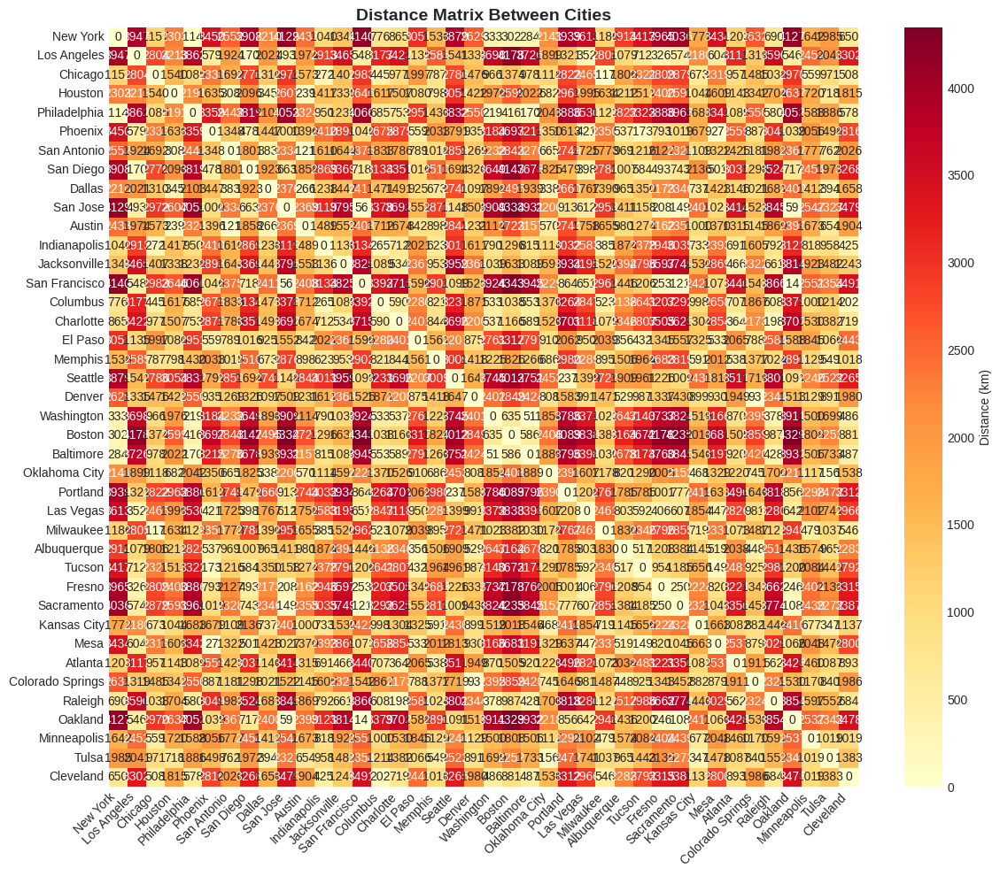


🧬 Starting Genetic Algorithm...
Population Size: 100
Elite Size: 20
Mutation Rate: 0.01
Generations: 500

Generation   0: Best Distance = 57278.92 km
Generation  50: Best Distance = 33094.89 km
Generation 100: Best Distance = 25587.78 km
Generation 150: Best Distance = 25132.82 km
Generation 200: Best Distance = 25742.66 km
Generation 250: Best Distance = 25901.85 km
Generation 300: Best Distance = 25689.67 km
Generation 350: Best Distance = 25304.54 km
Generation 400: Best Distance = 27684.73 km
Generation 450: Best Distance = 25244.95 km

✓ Final Best Distance: 23262.30 km

 Generating visualizations...


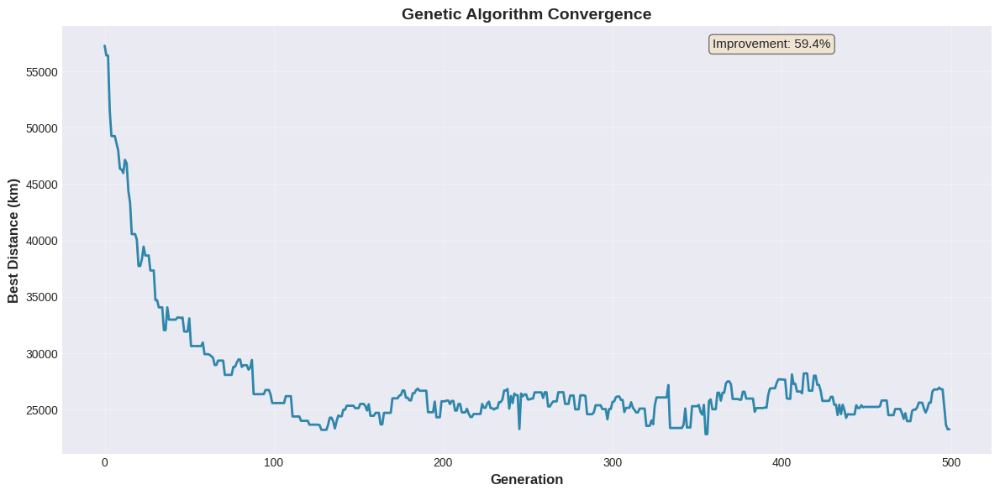

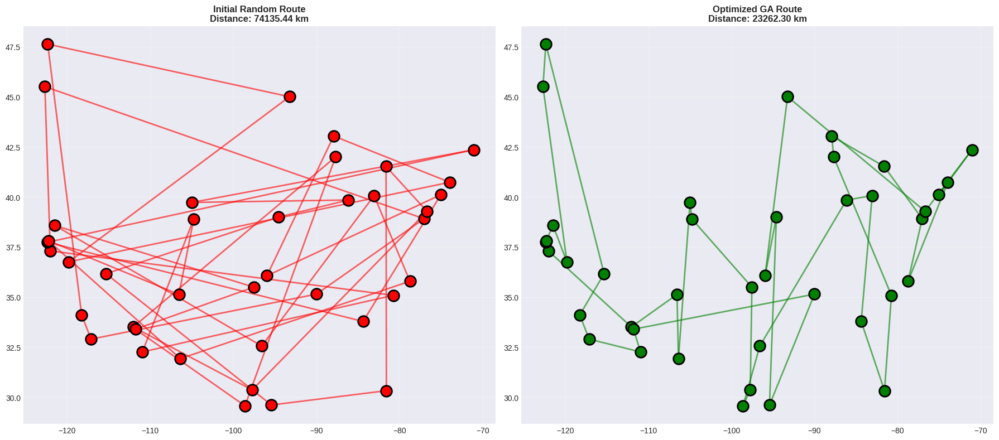

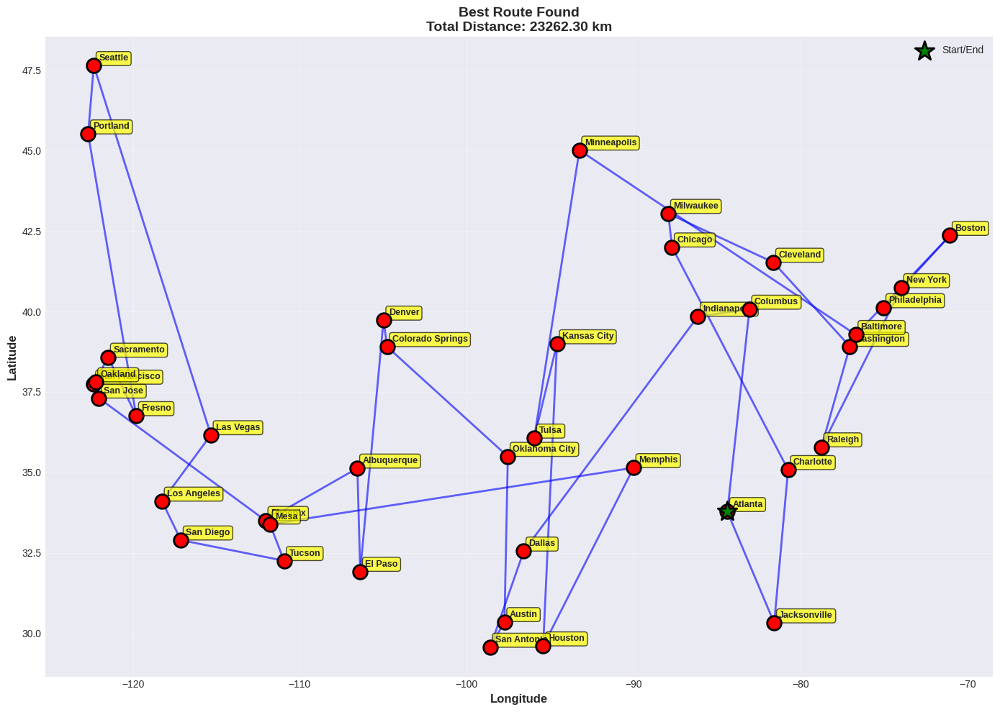


 Creating evolution animation...



 Comparing with other algorithms...

🧬 Starting Genetic Algorithm...
Population Size: 100
Elite Size: 20
Mutation Rate: 0.01
Generations: 300

Generation   0: Best Distance = 57531.69 km
Generation  50: Best Distance = 34559.21 km
Generation 100: Best Distance = 29322.99 km
Generation 150: Best Distance = 28810.68 km
Generation 200: Best Distance = 25852.39 km
Generation 250: Best Distance = 24853.27 km

✓ Final Best Distance: 25791.46 km


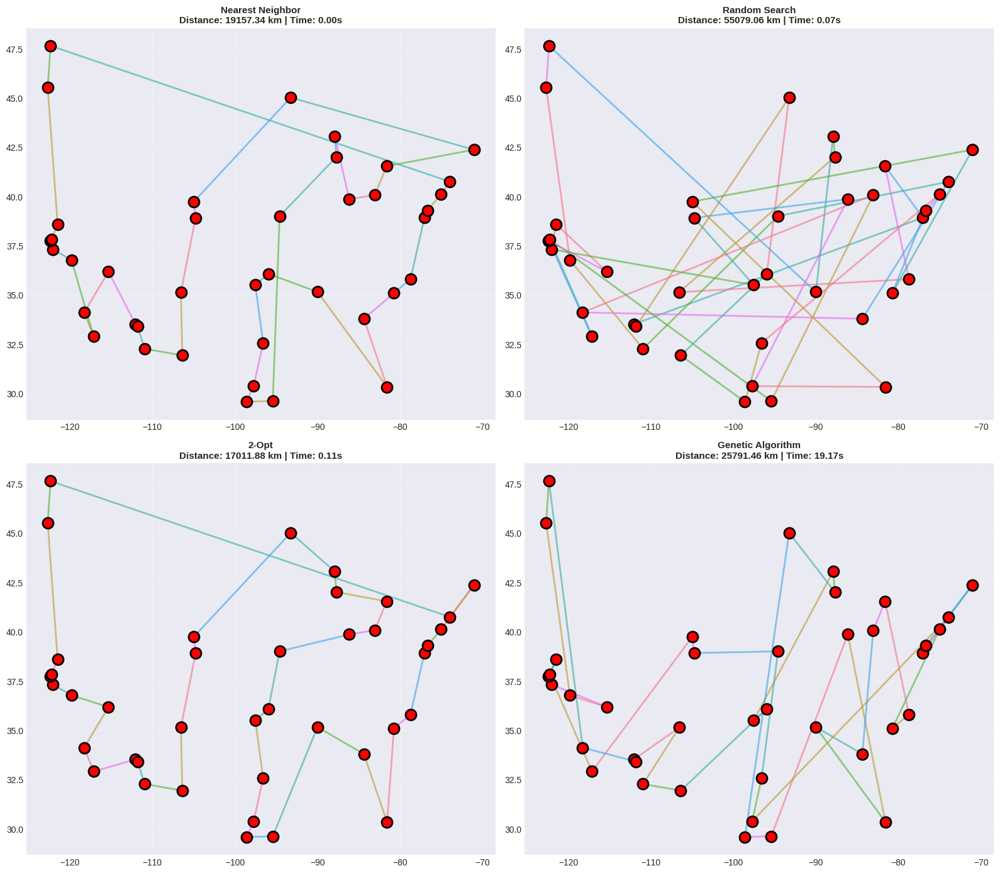


 Algorithm Comparison Summary:
        Algorithm  Distance (km)  Time (s)
            2-Opt   17011.876965  0.114855
 Nearest Neighbor   19157.338036  0.000357
Genetic Algorithm   25791.455994 19.173180
    Random Search   55079.061026  0.068792

 Analyzing population diversity...


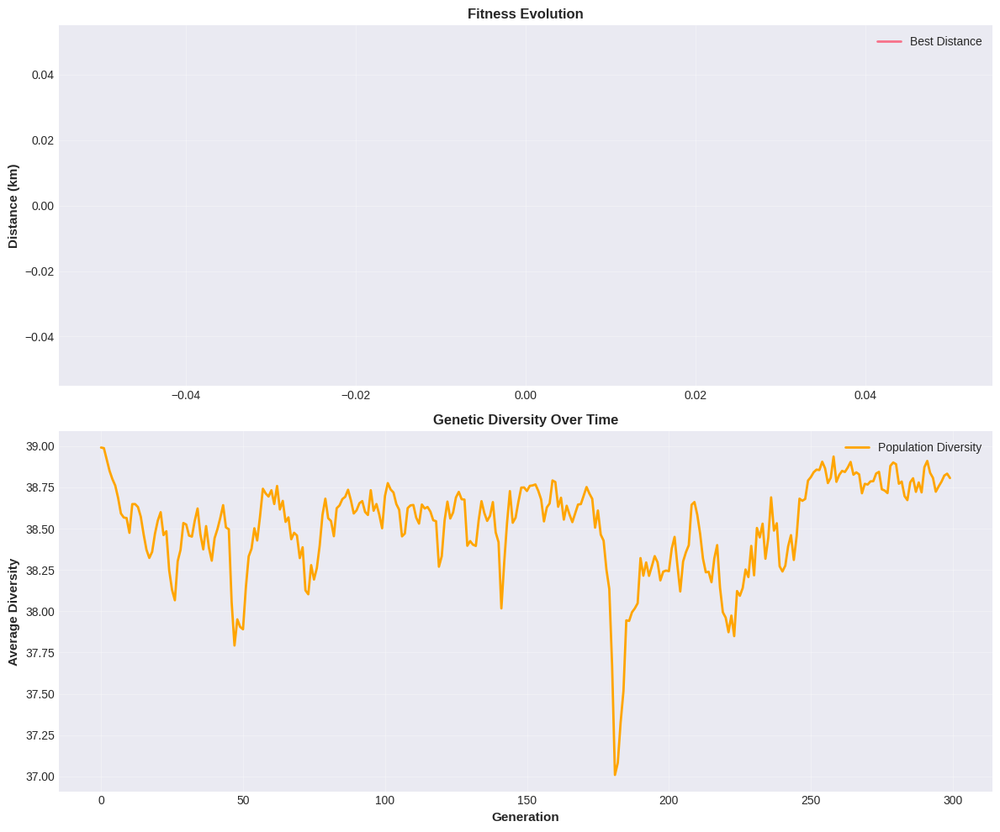


 Running parameter sensitivity analysis...
  Testing: pop_size=50, mutation_rate=0.001

🧬 Starting Genetic Algorithm...
Population Size: 50
Elite Size: 10
Mutation Rate: 0.001
Generations: 200

Generation   0: Best Distance = 50937.04 km
Generation  50: Best Distance = 33540.37 km
Generation 100: Best Distance = 25486.05 km
Generation 150: Best Distance = 25163.63 km

✓ Final Best Distance: 24457.25 km
  Testing: pop_size=50, mutation_rate=0.01

🧬 Starting Genetic Algorithm...
Population Size: 50
Elite Size: 10
Mutation Rate: 0.01
Generations: 200

Generation   0: Best Distance = 56694.28 km
Generation  50: Best Distance = 31089.21 km
Generation 100: Best Distance = 31336.70 km
Generation 150: Best Distance = 32735.98 km

✓ Final Best Distance: 26577.93 km
  Testing: pop_size=50, mutation_rate=0.05

🧬 Starting Genetic Algorithm...
Population Size: 50
Elite Size: 10
Mutation Rate: 0.05
Generations: 200

Generation   0: Best Distance = 57220.77 km
Generation  50: Best Distance = 46309.7

In [ ]:
if __name__ == "__main__":
    print(" TSP with Genetic Algorithm - Ready!")
    print("STEP 1: Upload your CSV file")


    # Upload file in Google Colab
    from google.colab import files
    print("\n Please upload your CSV file (with columns: SNo, City, State, Location):")
    uploaded = files.upload()

    # Get the filename
    filename = list(uploaded.keys())[0]
    print(f"\n File '{filename}' uploaded successfully!")


    print("STEP 2: Processing and Solving TSP")


    # Run the main function
    main(filename)

In [ ]:
!pip install geopy